In [1]:
#Import relevant python files
from calculations.data_processor import * #read_excel_data, read_csv_data, perform_calculation , * means importing ALL code within, but may cause namespace clutter!!
from calculations.datahandling import *
from plotting.plot_generator import * #plot_irr, plot_PVcalc

In [4]:
#Test code functionality:

a = read_irr_data('data/Data_solar_irr_NOR.csv')
b = read_csv_data('data/Market_price.csv')

display(a)
print()
display(b)

,G(i),H_sun,T2m,WS10m,Int
2005-01-01 00:00:00,0.0,0.0,-4.03,2.14,0.0
2005-01-01 01:00:00,0.0,0.0,-4.75,2.14,0.0
2005-01-01 02:00:00,0.0,0.0,-5.26,2.21,0.0
2005-01-01 03:00:00,0.0,0.0,-5.60,2.28,0.0
2005-01-01 04:00:00,0.0,0.0,-5.46,2.21,0.0
...,...,...,...,...,...
2020-12-31 19:00:00,0.0,0.0,-2.34,0.90,0.0
2020-12-31 20:00:00,0.0,0.0,-2.44,0.83,0.0
2020-12-31 21:00:00,0.0,0.0,-2.51,0.76,0.0
2020-12-31 22:00:00,0.0,0.0,-2.70,0.76,0.0


,NO3
Date,
2018-01-01 00:00:00,26.33
2018-01-01 01:00:00,26.43
2018-01-01 02:00:00,26.10
2018-01-01 03:00:00,24.70
2018-01-01 04:00:00,24.74
...,...
2022-12-31 19:00:00,23.87
2022-12-31 20:00:00,23.82
2022-12-31 21:00:00,23.93


## Running scripts

In [2]:
%run main.py


The calculated PV power production is:                     PV_power
2005-01-01 00:00:00       0.0
2005-01-01 01:00:00       0.0
2005-01-01 02:00:00       0.0
2005-01-01 03:00:00       0.0
2005-01-01 04:00:00       0.0
...                       ...
2020-12-31 19:00:00       0.0
2020-12-31 20:00:00       0.0
2020-12-31 21:00:00       0.0
2020-12-31 22:00:00       0.0
2020-12-31 23:00:00       0.0

[140256 rows x 1 columns]

PV Panel information:
   P_max  V_oc  V_mp  I_sc  I_mp  n_eff  no_panels  length  width  alfa
0    280  39.5  31.2  9.71  9.07  0.167         40     1.7      1 -0.39

Irradiance data and other information:
                     G(i)  H_sun   T2m  WS10m  Int
2005-01-01 00:00:00   0.0    0.0 -4.03   2.14  0.0
2005-01-01 01:00:00   0.0    0.0 -4.75   2.14  0.0
2005-01-01 02:00:00   0.0    0.0 -5.26   2.21  0.0
2005-01-01 03:00:00   0.0    0.0 -5.60   2.28  0.0
2005-01-01 04:00:00   0.0    0.0 -5.46   2.21  0.0
...                   ...    ...   ...    ...  ...
2020-12-31

c:\Users\benny\Documents\Preliminary_project\Preliminary-project\TET4565\01_Hybrid_model\calculations\data_processor.py:45: RuntimeWarning: invalid value encountered in true_divide
  PV_power = np.round(P*irr_eff/irr_ref)


## Setting up case using functions directly in notebook

In [3]:
#Alternatively, can also run the code directly from the imported functions:
input_data_PV = read_excel_data('data/PV_spec.xlsx')
input_data_Irr = read_csv_data('data/Data_solar_irr_NOR.csv')

# Calculate PV power production 
PV_power = perform_calculation(input_data_PV,input_data_Irr)

# Generate a plot of the irradiance and PV production data (data, time resolution, color)
plot_irr(input_data_Irr, 'H', 'purple')
plot_PVcalc(PV_power, 'H', 'orange')

c:\Users\benny\Documents\Preliminary_project\Preliminary-project\TET4565\01_Hybrid_model\calculations\data_processor.py:45: RuntimeWarning:

invalid value encountered in true_divide



## Work space

Just cells consisting of data shaping etc. Not important and can be deleted if it takes up uneccessary space.
- Benjamin

,Ormsetvatn,Buavatn,Solar
Date,,,
2018-01-01 00:00:00,0.80,0.08,0.0
2018-01-01 01:00:00,0.00,0.00,0.0
2018-01-01 02:00:00,0.00,0.00,0.0
2018-01-01 03:00:00,0.86,0.08,0.0
2018-01-01 04:00:00,15.63,1.48,0.0
...,...,...,...
2022-12-31 19:00:00,0.00,0.00,0.0
2022-12-31 20:00:00,0.00,0.00,0.0
2022-12-31 21:00:00,0.00,0.00,0.0


<AxesSubplot:xlabel='Date'>

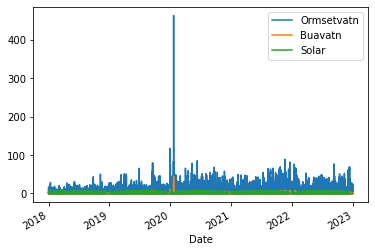

In [32]:
#merging documents sent from Alex into a single dataframe

import pandas as pd

#FIXING INFLOW (and solar etc.) :
file_paths = ["data/raw/Inflows - 2018.csv", "data/raw/Inflows - 2019.csv", "data/raw/Inflows - 2020.csv", "data/raw/Inflows - 2021.csv", "data/raw/Inflows - 2022.csv"]  # Add your file paths here

# Read Excel files into DataFrames
dataframes = [pd.read_csv(file_path) for file_path in file_paths]

# Merge DataFrames vertically
inflow = pd.concat(dataframes, axis=0, ignore_index=True)
inflow.set_index("Date_time", inplace=True)
inflow.index = pd.to_datetime(inflow.index)
inflow.index.name = 'Date'


#Save to csv:
#inflow.to_csv("data/Data_inflow.csv")

display(inflow)
inflow.plot()

,NO3
Date,
2019-01-01 00:00:00,45.36
2019-01-01 01:00:00,45.31
2019-01-01 02:00:00,45.37
2019-01-01 03:00:00,45.21
2019-01-01 04:00:00,44.90
...,...
NaT,NaN
NaT,NaN
NaT,NaN


<AxesSubplot:xlabel='Date'>

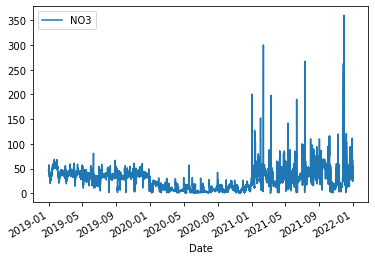

In [66]:
#FIXING MARKET PRICES:
file_paths = ["data/raw/historical_prices - 2019.csv", "data/raw/historical_prices - 2020.csv", "data/raw/historical_prices - 2021.csv"]  # Add your file paths here

# Read Excel files into DataFrames
dataframes = [pd.read_csv(file_path) for file_path in file_paths]

# Merge DataFrames vertically
market_price = pd.concat(dataframes, axis=0, ignore_index=True)
market_price.set_index("Date", inplace=True)
market_price.index = pd.to_datetime(market_price.index)

#Save to csv:
market_price.to_csv("data/raw/Market_price.csv")


display(market_price)
market_price.plot()


In [41]:
#Fixing the two irregular historical price files: (2018 and 2022)


#FIXING MARKET PRICES:
file_paths = ["data/raw/historical_prices - 2018.csv"]  # Add your file paths here

# Read Excel files into DataFrames
dataframes = [pd.read_csv(file_path) for file_path in file_paths]

# Merge DataFrames vertically
test = pd.concat(dataframes, axis=0, ignore_index=True)
#test.set_index("Date", inplace=True)
#test.index = pd.to_datetime(test.index)
# Split the "Date;kurs;Sys;NO1;NO2;NO3;NO4;NO5" column into separate columns
test[['Date', 'kurs', 'Sys', 'NO1', 'NO2', 'NO3', 'NO4', 'NO5']] = test['Date;kurs;Sys;NO1;NO2;NO3;NO4;NO5'].str.split(';', expand=True)

# Select only the "Date" and "NO3" columns
selected_columns = ['Date', 'NO3']
test = test[selected_columns]

# Convert "Date" column to datetime format (if needed)

test['Date'] = pd.to_datetime(test['Date'], format='%d.%m.%Y %H:%M')
test.set_index("Date", inplace=True)

#test.to_csv("data/raw/historical_prices - 2018_alt.csv")

# Display the resulting DataFrame
display(test)

,NO3
Date,
2018-01-01 00:00:00,26.33
2018-01-01 01:00:00,26.43
2018-01-01 02:00:00,26.1
2018-01-01 03:00:00,24.7
2018-01-01 04:00:00,24.74
...,...
2018-12-31 19:00:00,47.51
2018-12-31 20:00:00,45.82
2018-12-31 21:00:00,45.41


In [55]:
file_paths = ["data/raw/historical_prices - 2022.csv"]  # Add your file paths here

# Read Excel files into DataFrames
dataframes = [pd.read_csv(file_path, sep=',' ) for file_path in file_paths]

# Initialize an empty list to store the selected columns from each DataFrame
selected_columns = []

# Loop through each DataFrame in the list
for df in dataframes:
    # Select the "Date" and "NO3" columns and append them to the selected_columns list
    selected_columns.append(df[['Date', 'NO3']])

# Concatenate the selected columns into a new DataFrame
new_df = pd.concat(selected_columns, axis=0)
new_df['Date'] = pd.to_datetime(new_df['Date'], format='%d.%m.%Y %H:%M')
new_df.set_index("Date", inplace=True)


new_df.to_csv("data/raw/historical_prices - 2022_alt.csv")

display(new_df)



,NO3
Date,
2022-01-01 00:00:00,46.60
2022-01-01 01:00:00,41.33
2022-01-01 02:00:00,42.18
2022-01-01 03:00:00,44.37
2022-01-01 04:00:00,37.67
...,...
2022-12-31 19:00:00,23.87
2022-12-31 20:00:00,23.82
2022-12-31 21:00:00,23.93


,NO3
Date,
2018-01-01 00:00:00,26.33
2018-01-01 01:00:00,26.43
2018-01-01 02:00:00,26.10
2018-01-01 03:00:00,24.70
2018-01-01 04:00:00,24.74
...,...
2022-12-31 19:00:00,23.87
2022-12-31 20:00:00,23.82
2022-12-31 21:00:00,23.93


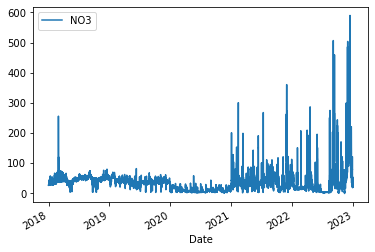

In [67]:
#Final

# List of file paths
file_paths = [
    'data/raw/historical_prices - 2018_alt.csv',
    'data/raw/Market_price.csv',
    'data/raw/historical_prices - 2022_alt.csv'
]

# Read each CSV file into a DataFrame and store them in a list
dataframes = [pd.read_csv(file_path) for file_path in file_paths]

# Concatenate the DataFrames along axis 0 (row-wise)
merged_df = pd.concat(dataframes, axis=0)
merged_df['Date'] = pd.to_datetime(merged_df['Date'])
merged_df.set_index("Date", inplace=True)

display(merged_df)
merged_df.plot()

merged_df.to_csv("data/Market_price.csv")
